In [1]:
import pandas as pd 
import matplotlib.pyplot as plt 
import seaborn as sns 
import matplotlib as mpl 
import pandas as pd 
import numpy as np

from mpl_toolkits.mplot3d import Axes3D
import plotly.graph_objects as go
from scipy.interpolate import griddata

dpi = 300 
mpl.rcParams['figure.dpi']= dpi

In [2]:
# Read the CSV file
# df = pd.read_csv('r1_6c_XYZ_00004_6.00000000E+01.csv', skiprows=2, 
#             names = ['X', 'Y', 'Z', 'Pressure (Pa)', 'Temperature ($^{\circ}C$)', '$KABS_1 (M^2)$', '$KABS_2 (M^2)$', '$KABS_3 (M^2)$']
#            )

df = pd.read_csv('subregion')

In [3]:
df.columns = ['Easting [m]', 'Northing [m]', 'Elevation [m]', 'Pressure [Pa]', 'Porosity', 'Permibility']
df.columns


Index(['Easting [m]', 'Northing [m]', 'Elevation [m]', 'Pressure [Pa]',
       'Porosity', 'Permibility'],
      dtype='object')

In [4]:
# Extract coordinates and properties
x = df['Easting [m]']
y = df['Northing [m]']
z = df['Elevation [m]']
pressure = df['Pressure [Pa]']
porosity = df['Porosity']
permeability = df['Permibility']

# Create a regular grid to interpolate the data
xi = np.linspace(x.min(), x.max(), 10) # 10 is the grid, you can change it to any number 
yi = np.linspace(y.min(), y.max(), 10)
zi = np.linspace(z.min(), z.max(), 10)
xi_grid, yi_grid, zi_grid = np.meshgrid(xi, yi, zi)

In [9]:
# Function to create 3D contour plot using plotly
def plot_3d_contour(x, y, z, property_values, property_name):
    # Interpolate the property values onto the regular grid
    points = np.column_stack((x, y, z))
    property_grid = griddata(points, property_values, (xi_grid, yi_grid, zi_grid), method='linear')
    
    # Create the 3D contour plot
    fig = go.Figure(data=go.Volume(
        x=xi_grid.flatten(),
        y=yi_grid.flatten(),
        z=zi_grid.flatten(),
        value=property_grid.flatten(),
        isomin=property_values.min(),
        isomax=property_values.max(),
        opacity=0.1,
        surface_count=15,
        colorbar=dict(title=property_name)
    ))
    
    fig.update_layout(
        scene=dict(
            xaxis_title='Easting [m]',
            yaxis_title='Northing [m]',
            zaxis_title='Elevation [m]'
        ),
        title=f'3D Contour Plot of {property_name}'
    )
    
    fig.show()

# Function to create 2D slice contour plots
def plot_2d_slice(x, y, z, property_values, property_name, slice_type='xy', slice_value=None):
    fig, ax = plt.subplots(figsize=(10, 8))
    
    if slice_type == 'xy':
        if slice_value is None:
            slice_value = z.mean()
        mask = np.abs(z - slice_value) < (z.max() - z.min()) * 0.01
        xi_2d, yi_2d = np.meshgrid(xi, yi)
        zi_2d = griddata((x[mask], y[mask]), property_values[mask], (xi_2d, yi_2d), method='linear')
        plt.contourf(xi_2d, yi_2d, zi_2d, levels=20, cmap='viridis')
        plt.xlabel('Easting [m]')
        plt.ylabel('Northing [m]')
        
    elif slice_type == 'xz':
        if slice_value is None:
            slice_value = y.mean()
        mask = np.abs(y - slice_value) < (y.max() - y.min()) * 0.01
        xi_2d, zi_2d = np.meshgrid(xi, zi)
        yi_2d = griddata((x[mask], z[mask]), property_values[mask], (xi_2d, zi_2d), method='linear')
        plt.contourf(xi_2d, zi_2d, yi_2d, levels=20, cmap='viridis')
        plt.xlabel('Easting [m]')
        plt.ylabel('Elevation [m]')
        
    elif slice_type == 'yz':
        if slice_value is None:
            slice_value = x.mean()
        mask = np.abs(x - slice_value) < (x.max() - x.min()) * 0.01
        yi_2d, zi_2d = np.meshgrid(yi, zi)
        xi_2d = griddata((y[mask], z[mask]), property_values[mask], (yi_2d, zi_2d), method='linear')
        plt.contourf(yi_2d, zi_2d, xi_2d, levels=20, cmap='viridis')
        plt.xlabel('Northing [m]')
        plt.ylabel('Elevation [m]')
    else: 
        raise ValueError(f"Invalid slice_type: {slice_type}. Must be one of 'xy', 'xz', or 'yz'")
    
    plt.colorbar(label=property_name)
    if slice_type == 'xy':
        plt.title(f'2D {slice_type.upper()} Slice at z={slice_value:.2f}')
    elif slice_type == 'xz':
        plt.title(f'2D {slice_type.upper()} Slice at y={slice_value:.2f}')
    else: 
        plt.title(f'2D {slice_type.upper()} Slice at x={slice_value:.2f}')

    plt.show()

In [8]:
a = 'yz'
a[0]

'y'

In [6]:
# Example usage:
# 3D contour plot for pressure
plot_3d_contour(x, y, z, pressure, 'Pressure [Pa]')

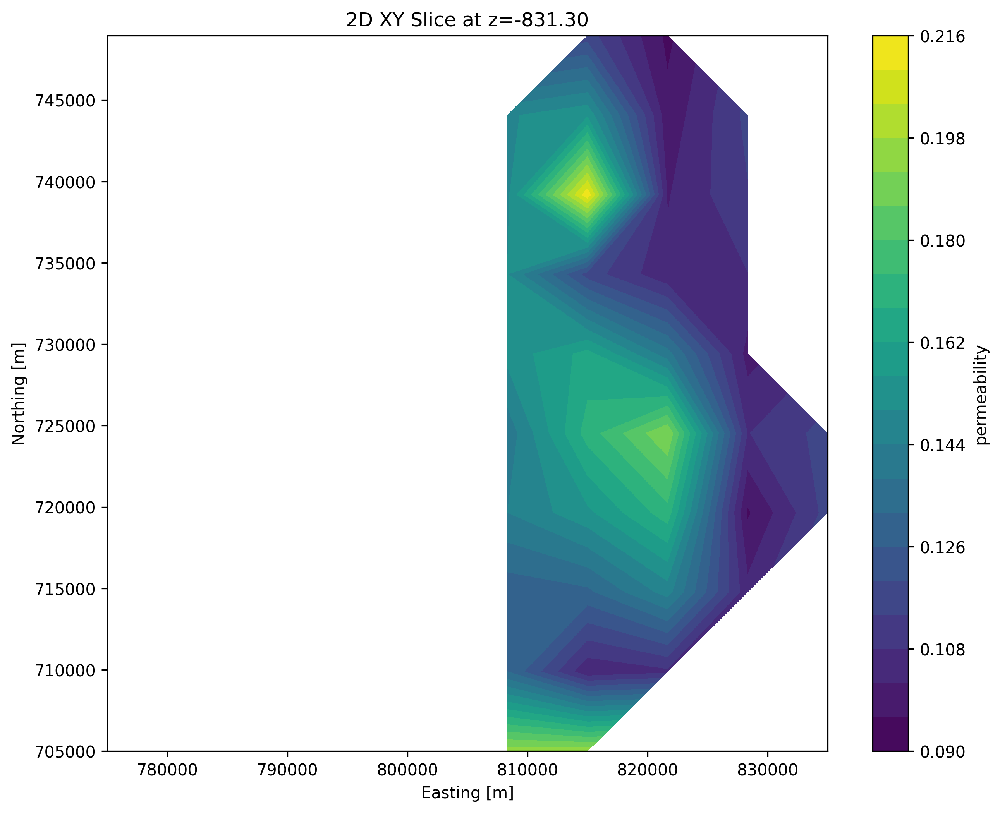

In [13]:
# 2D slice plots for pressure
# plot_2d_slice(x, y, z, pressure, 'Pressure [Pa]', slice_type='xy', slice_value=z.mean())
# plot_2d_slice(x, y, z, pressure, 'Pressure [Pa]', slice_type='xz', slice_value=y.mean())
# plot_2d_slice(x, y, z, pressure, 'Pressure [Pa]', slice_type='yz', slice_value=x.mean())

# You can do the same for porosity and permeability by replacing 'pressure' with 'porosity' or 'permeability'
plot_2d_slice(x, y, z, permeability, 'permeability', slice_type='xy', slice_value=z.mean())

In [13]:
data.to_csv('processed_data.csv', index=False)

In [16]:
plt.plot(np.arange(len(x)), x)

NameError: name 'x' is not defined

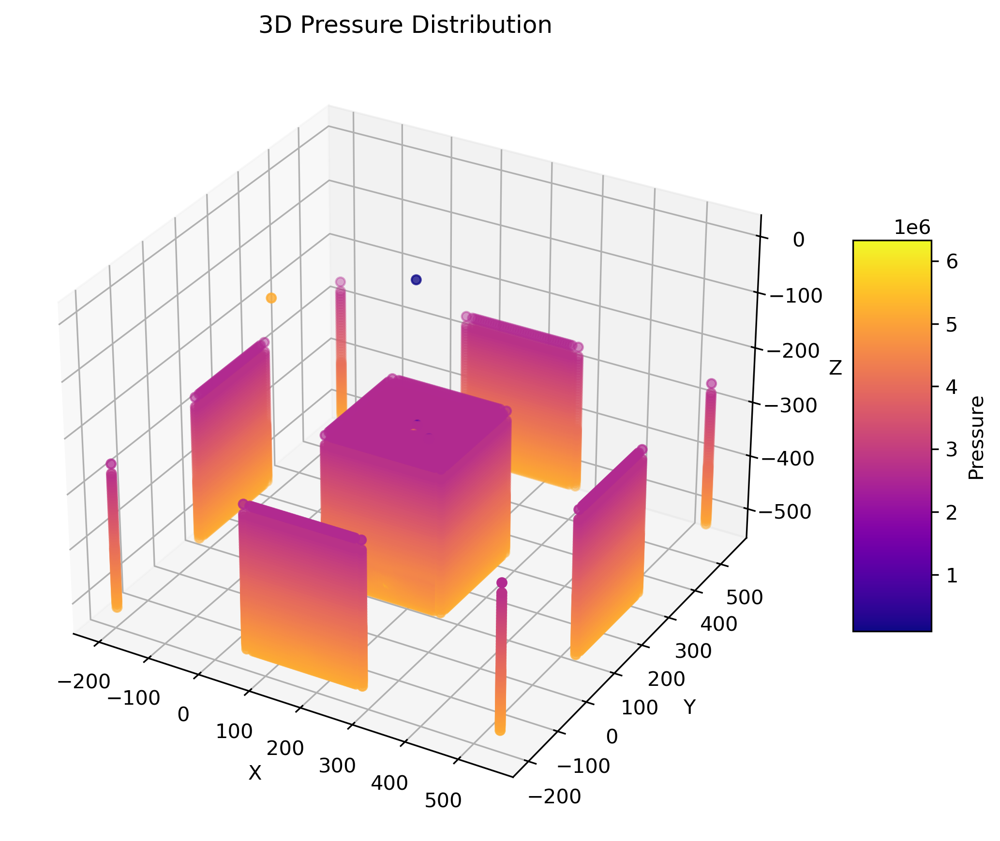

In [17]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Load the dataset
file_path = 'processed_data.csv'
data = pd.read_csv(file_path)

# Extract relevant columns
x = data['X']
y = data['Y']
z = data['Z']

pressure = data['Pressure (Pa)']

# Create a 3D scatter plot
fig = plt.figure(figsize=(10, 7))
ax = fig.add_subplot(111, projection='3d')

# Plot the points, using pressure to determine the color
scatter = ax.scatter(x, y, z, c=pressure, cmap='plasma')

# Add a color bar to indicate pressure values
color_bar = plt.colorbar(scatter, ax=ax, shrink=0.5, aspect=5)
color_bar.set_label('Pressure')

# Set labels for the axes
ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

# Set title
ax.set_title('3D Pressure Distribution')

# Show the plot
plt.show()


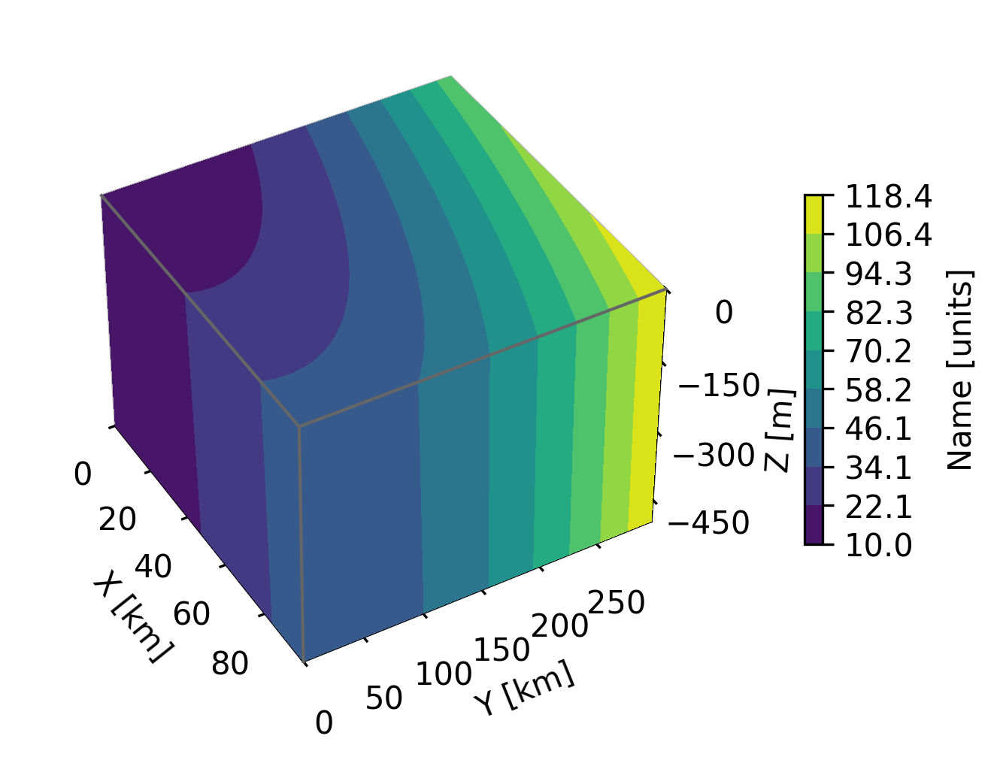

In [16]:
import matplotlib.pyplot as plt
import numpy as np

# Define dimensions
Nx, Ny, Nz = 100, 300, 500
X, Y, Z = np.meshgrid(np.arange(Nx), np.arange(Ny), -np.arange(Nz))

# Create fake data
data = (((X+100)**2 + (Y-20)**2 + 2*Z)/1000+1)

kw = {
    'vmin': data.min(),
    'vmax': data.max(),
    'levels': np.linspace(data.min(), data.max(), 10),
}

# Create a figure with 3D ax
fig = plt.figure(figsize=(5, 4))
ax = fig.add_subplot(111, projection='3d')

# Plot contour surfaces
_ = ax.contourf(
    X[:, :, 0], Y[:, :, 0], data[:, :, 0],
    zdir='z', offset=0, **kw
)
_ = ax.contourf(
    X[0, :, :], data[0, :, :], Z[0, :, :],
    zdir='y', offset=0, **kw
)
C = ax.contourf(
    data[:, -1, :], Y[:, -1, :], Z[:, -1, :],
    zdir='x', offset=X.max(), **kw
)
# --


# Set limits of the plot from coord limits
xmin, xmax = X.min(), X.max()
ymin, ymax = Y.min(), Y.max()
zmin, zmax = Z.min(), Z.max()
ax.set(xlim=[xmin, xmax], ylim=[ymin, ymax], zlim=[zmin, zmax])

# Plot edges
edges_kw = dict(color='0.4', linewidth=1, zorder=1e3)
ax.plot([xmax, xmax], [ymin, ymax], 0, **edges_kw)
ax.plot([xmin, xmax], [ymin, ymin], 0, **edges_kw)
ax.plot([xmax, xmax], [ymin, ymin], [zmin, zmax], **edges_kw)

# Set labels and zticks
ax.set(
    xlabel='X [km]',
    ylabel='Y [km]',
    zlabel='Z [m]',
    zticks=[0, -150, -300, -450],
)

# Set zoom and angle view
ax.view_init(40, -30, 0)
ax.set_box_aspect(None, zoom=0.9)

# Colorbar
fig.colorbar(C, ax=ax, fraction=0.02, pad=0.1, label='Name [units]')

# Show Figure
plt.show()

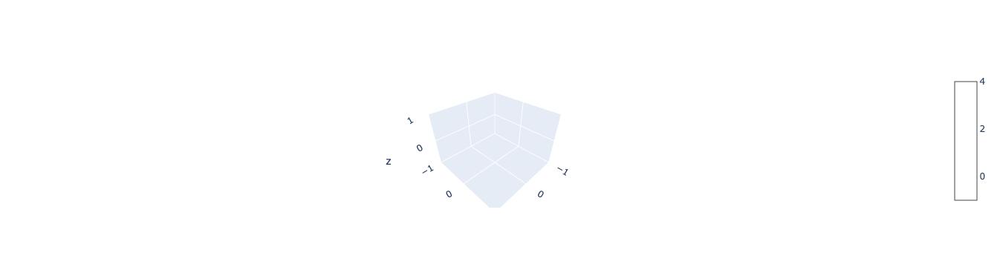

In [45]:
import plotly.graph_objects as go
import numpy as np
X, Y, Z = np.mgrid[-1:1:30j, -1:1:30j, -1:1:30j]
values =    np.sin(np.pi*X) * np.cos(np.pi*Z) * np.sin(np.pi*Y)

fig = go.Figure(data=go.Volume(
    x=data['X'],
    y=data['Y'],
    z=data['Z'],
    value=data['Pressure (Pa)'],
    # isomin=-0.1,
    # isomax=0.8,
    # opacity=0.1, # needs to be small to see through all surfaces
    # surface_count=21, # needs to be a large number for good volume rendering
    ))
fig.show()

In [41]:
for i in np.arange(1, data.shape[0]): 
    if data.shape[0] % i == 0: 
        print(i)

1
2
7
14
49
98
1697
3394
11879
23758
83153


In [42]:
data.shape[0] / 98

1697.0